# Clip trajectories obtained using GRUs

GRU hidden states were projected to a lower-dimensional space to obtain compact trajectories.

In [1]:
import numpy as np
import pandas as pd
import pickle
import os
from utils import _get_clip_lengths
from cc_utils import _get_clip_labels

import random



# plot
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
from plotly.subplots import make_subplots
pio.templates.default = 'plotly_white'
from plot_utils import (_hex_to_rgb, _plot_ts, 
    _get_norm, _get_ts,
    _trajectory3D, _variance3D, _big_markers)
pio.orca.config.executable = '/home/joyneelm/fire/bin/orca'

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


## Parameters

In [2]:
class ARGS():
    roi = 300
    net = 7
    subnet = 'wb'
    zscore = 1
    k_fold = 10

    batch_size = 32
    num_epochs = 45
    train_size = 100
    
    roi_name = "roi"
    
    #gru
    k_hidden = 32
    k_layers = 1
    k_dim = 3

In [3]:
args = ARGS()
K_RUNS = 4
K_SEED = 330

## Load results
Results used here are generated by the following files:
- low_dim_clip.py

For architecture, see corresponding files.

In [4]:
def _get_results(RES_DIR, args):
    
    load_path = (RES_DIR + 
            '/%s_%d_net_%d' %(args.roi_name, args.roi, args.net) +
            '_trainsize_%d' %(args.train_size) +
            '_k_hidden_%d' %(args.k_hidden) +
            '_kdim_%d' %(args.k_dim) +
            '_k_layers_%d_batch_size_%d' %(args.k_layers, args.batch_size) +
            '_num_epochs_%d_z_%d.pkl' %(args.num_epochs, args.zscore))

    with open(load_path, 'rb') as f:
        r = pickle.load(f)
    
    return r

In [5]:
RES_DIR = 'results/clip_gruencoder'

r, r_prob, df = _get_results(RES_DIR, args)
print('Test accuracy for low dim model = %0.3f' %np.mean(r['test']))

# test_list = r['test_subs']
subject_list = df[0]['Subject'].unique()
train_list = subject_list[:args.train_size]
test_list = subject_list[args.train_size:]

# where are the clips within the run?
timing_file = pd.read_csv('data/videoclip_tr_lookup.csv')
timing_file

Test accuracy for low dim model = 0.633


,clipno_overall,run,clipno_in_run,clip_name,start_tr,stop_tr
0,1,MOVIE1_7T_AP,1,twomen,20.0000,264.0417
1,2,MOVIE1_7T_AP,2,bridgeville,284.0833,505.7083
2,3,MOVIE1_7T_AP,3,pockets,525.7500,713.7500
3,4,MOVIE1_7T_AP,4,overcome,733.7917,797.5417
4,5,MOVIE1_7T_AP,5,testretest1,817.5833,900.9583
5,6,MOVIE2_7T_PA,1,inception,20.0000,246.7083
6,7,MOVIE2_7T_PA,2,socialnet,266.7500,525.3333
7,8,MOVIE2_7T_PA,3,oceans,545.3750,794.5833
8,9,MOVIE2_7T_PA,4,testretest2,814.5833,897.9583
9,10,MOVIE3_7T_PA,1,flower,20.0000,200.5417


## Visualization parameters

In [6]:
colors = ["#999999", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7",
    '#8dd3c7', '#8c564b', '#bebada', '#fb8072', '#80b1d3', '#fdb562', '#b3de69', '#fccde5']

clip_length = _get_clip_lengths()
clip_length['testretest'] = clip_length['testretest1']
pretty_clip = {}
for clip in clip_length:
    pretty_clip[clip] = '%s (%d)' %(clip, clip_length[clip])
    
clip_color = _get_clip_labels()
clip_color['testretest'] = 0
label_to_clip = {}
for key, item in clip_color.items():
    label_to_clip[item] = key
label_to_clip[0] = 'testretest'
label_to_clip

{1: 'twomen',
 2: 'bridgeville',
 3: 'pockets',
 4: 'overcome',
 0: 'testretest',
 5: 'inception',
 6: 'socialnet',
 7: 'oceans',
 8: 'flower',
 9: 'hotel',
 10: 'garden',
 11: 'dreary',
 12: 'homealone',
 13: 'brokovich',
 14: 'starwars'}

In [7]:
mean_clip_len = np.mean(np.array([i for i in clip_length.values()]))
print(mean_clip_len)

174.3684210526316


## Clip trajectories
Mean trajectory computed across test participants is plotted with the thick line.
Variance across participant trajectories indicated with scattered points.

In [8]:
def _plot_trajectory(df, test_list):
    '''
    plot mean trajectory across participants in test_list
    scatter individual trajectories for some participants
    figure too large if all participants are plotted
    k = 0.1 (10% of the participants)
    '''
    k = 0.1
    fig = go.Figure()
    
    for run in range(K_RUNS):
    
        # df is saved as dict with key 'run'
        run_df = df[run]
        plot_dim = [ii for ii in run_df.columns if 'dim' in ii]
        k_time = np.max(run_df['timepoint'].values) + 1
        
        # concatenate data across participants to compute mean
        ts_ccat = np.zeros((k_time, len(plot_dim), len(test_list)))
        
        run_name = 'MOVIE%d' %(run+1) #MOVIEx_7T_yz
        timing_df = timing_file[timing_file['run'].str.contains(run_name)]  
        timing_df = timing_df.reset_index(drop=True)

        # seed for picking a random fraction of the participants
        np.random.seed(K_SEED)
        for ii, subject in enumerate(test_list):

            ts = run_df[run_df['Subject']==int(subject)][plot_dim].values
            ts_ccat[:, :, ii] = ts

            # for k fraction of the subjects
            if np.random.uniform(0, 1, 1)[0] < k:
                # for all test participants
                # overlay each clip as 3D points
                for jj, clip in timing_df.iterrows():
                    clip_name = clip['clip_name']

                    # plot rest period in black
                    if jj==0:
                        start = 0
                    else:
                        start = stop # from previous iteration

                    stop = int(np.floor(clip['start_tr']))
                    color = '#000000'
                    sc = _variance3D(ts, color, 
                        name='fix', lg='fix',
                        start=start, stop=stop)
#                     fig.add_trace(sc)

                    # add color for movie periods
                    start = int(np.floor(clip['start_tr']))
                    stop = int(np.ceil(clip['stop_tr']))
                    color = colors[clip_color[clip_name]]

                    sc = _variance3D(ts, color, 
                        name=clip_name, lg=clip_name,
                        start=start, stop=stop)
#                     fig.add_trace(sc)

        ts_mean = np.mean(ts_ccat, axis=2)

        # underlay full run in black
        color = '#000000'
        if run==0:
            showlegend=False #True
        else:
            showlegend=False
        
        sc = _trajectory3D(ts_mean, color, 
            name='fix', lg='fix',
            showlegend=showlegend)
#         fig.add_trace(sc)

        sc = _big_markers(ts_mean, color, start=0, 
            lg=clip_name)
#         fig.add_trace(sc)

        # overlay each clip with color
        for jj, clip in timing_df.iterrows():
            clip_name = clip['clip_name']
            start = int(np.floor(clip['start_tr']))
            stop = int(np.ceil(clip['stop_tr']))
            color = colors[clip_color[clip_name]]
            
            sc = _trajectory3D(ts_mean, color,
                name=clip_name, lg=clip_name,
                showlegend=False, #True,
                start=start, stop=stop)
            fig.add_trace(sc)
            
            sc = _big_markers(ts_mean, color, start=start, 
                lg=clip_name)
            fig.add_trace(sc)
    
    return fig

In [9]:
# fig = _plot_trajectory(df, test_list)
# scale = 0.6
# camera = dict(
#     eye=dict(x=1*scale, y=1.25*scale, z=0*scale)
# )

# fig.update_layout(height=800, width=800,
#     font_color='black',
#     legend_orientation='h',
#     legend_font_size=18,
#     legend_x=1,
#     scene_camera=camera)
# fig.show()

In [10]:
# fig.write_image(file="figures/fig3a_trajectory.png",
#                 format="png", 
#                 scale=None,
#                 width=1500, 
#                 height=1500, 
#                 validate=True)

## version1

In [30]:
def _trajectory3D_pipes(ts_mean, ts_ste, color, 
    name='', lg='', showlegend=False,
    start=None, stop=None, opacity=1.0):
    '''
    plot trajectories in 3D
    used for mean trajectories
    input:
        ts: (3 x k_time)
        color: hex or rgb
        name: legendname
        lg: legend group

        start, stop: plotting interval
    '''
    
    if start == None:
        # handles rest period plotting
        start = 0
        stop = ts_mean.shape[0]
    import math
    traces={}
    interval = 3
    for t in range(start, stop-interval, interval):
#         print(t, t+9)
        mult = math.sqrt(t/float(stop))
        new_color = _hex_to_rgb(color)
        new_color = tuple([mult*i for i in new_color]) + (opacity,)
        new_color = 'rgba' + str(new_color)
        traces['trace_' + str(t)] = go.Scatter3d(x=ts_mean[t:t+interval+1, 0],
                                                 y=ts_mean[t:t+interval+1, 1],
                                                 z=ts_mean[t:t+interval+1, 2],
                                                 marker=dict(size=0.5*np.mean(ts_ste[t:t+interval+1]), color=new_color, opacity=opacity),
                                                 line=dict(width=2*np.mean(ts_ste[t:t+interval+1]), color=new_color),
                                                 mode='lines+markers',
                                                 name=name,
                                                 opacity=opacity,
                                                 showlegend=showlegend,
                                                 legendgroup=lg)
    
    return list(traces.values())

In [31]:
def _plot_trajectory_pipes(df, test_list):
    '''
    plot mean trajectory across participants in test_list
    scatter individual trajectories for some participants
    figure too large if all participants are plotted
    k = 0.1 (10% of the participants)
    '''
    k = 0.1
    fig = go.Figure()
    
    for run in range(K_RUNS):
    
        # df is saved as dict with key 'run'
        run_df = df[run]
        plot_dim = [ii for ii in run_df.columns if 'dim' in ii]
        k_time = np.max(run_df['timepoint'].values) + 1
        
        # concatenate data across participants to compute mean
        ts_ccat = np.zeros((k_time, len(plot_dim), len(test_list)))
        
        run_name = 'MOVIE%d' %(run+1) #MOVIEx_7T_yz
        timing_df = timing_file[timing_file['run'].str.contains(run_name)]  
        timing_df = timing_df.reset_index(drop=True)
        
        for ii, subject in enumerate(test_list):

            ts = run_df[run_df['Subject']==int(subject)][plot_dim].values
            ts_ccat[:, :, ii] = ts

        ts_mean = np.mean(ts_ccat, axis=2)
        # use with _trajectory3D_pipes
        ts_ste = 5*np.std(ts_ccat, axis=2) #/ np.sqrt(ts_ccat.shape[2])
        # use with _trajectory3D_pipes_with_errors
        #ts_ste = np.std(ts_ccat, axis=2) / np.sqrt(ts_ccat.shape[2])
        
        ts_radius = np.linalg.norm(ts_ste, axis=1)
#         print(ts_radius[:100])
#         print(ts_mean[:5,:], ts_ste[:5,:])
        
        # overlay each clip with color
        for jj, clip in timing_df.iterrows():
            if 'homealone' not in clip['clip_name']:
                opacity = 1.0
            else:
                opacity=1.0
            clip_name = clip['clip_name']
            if 'testretest' in clip_name:
                if '1' not in clip_name: 
                    continue
                clip_name = 'testretest'
                
            start = int(np.floor(clip['start_tr']))
            stop = int(np.ceil(clip['stop_tr']))
            color = colors[clip_color[clip_name]]
            
            # code for _trajectory3D_pipes
            traces = _trajectory3D_pipes(ts_mean, ts_radius, color,
                name=clip_name, lg=clip_name,
                showlegend=False, #True,
                start=start, stop=stop, opacity=opacity)
            for trace in traces:
                fig.add_trace(trace)
            
            '''
            # code for _trajectory3D_pipes_with_errors
            trace = _trajectory3D_pipes_with_errors(ts_mean, ts_ste, color, 
                                                    name=clip_name, lg=clip_name, 
                                                    showlegend=False, 
                                                    start=start, stop=stop)
            fig.add_trace(trace)
            '''
#             sc = _big_markers(ts_mean, color, start=start, 
#                 lg=clip_name)
#             fig.add_trace(sc)
    
    return fig

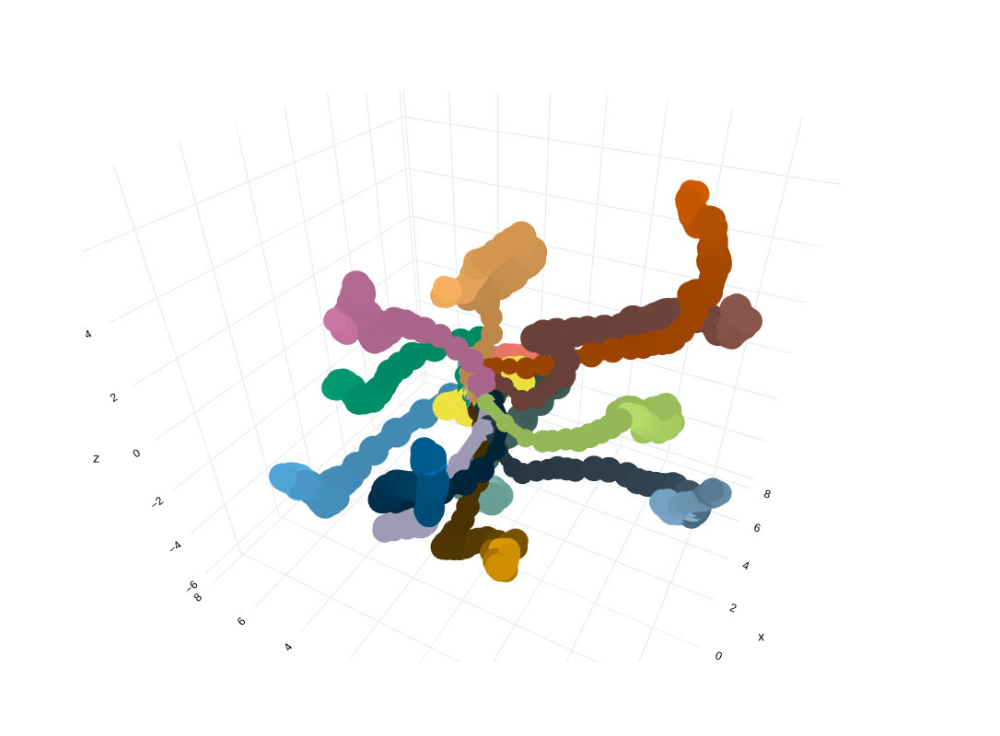

In [33]:
fig = _plot_trajectory_pipes(df, test_list)
scale = 1.5
num_trials = 1
for trial in range(num_trials):
    theta_degree = -109 #random.randint(-180, 180)
    phi_degree = 56 #random.randint(-180, 180)
    theta = (theta_degree*np.pi/360)
    phi = (phi_degree*np.pi/360)
    z = scale*np.cos(theta)
    y = scale*np.sin(theta)*np.sin(phi)
    x = scale*np.sin(theta)*np.cos(phi)
    camera = dict(
        eye=dict(x=x, y=y, z=z)
    )

    fig.update_layout(height=800, width=800,
        font_color='black',
      legend_orientation='h',
        legend_font_size=18,
        legend_x=1,
        scene_camera=camera)
    fig.show()
    fig.write_image(file=f"figures/trajectories/fig3a_trial{trial}_theta{theta_degree}_phi{phi_degree}_homealone.png",
                    format="png", 
                    scale=None,
                    width=1500, 
                    height=1500, 
                    validate=True)

## Distance between trajectories
To compute distance between two clip trajectories, A and B,
1. compute mean clip B trajectory
2. compute distance of each participant clip A trajectory with mean clip B trajectory
3. plot mean and variance (1 SEM) of these distances

In [17]:
def _trajectory_dist(df, test_list, list_of_clips):
    '''
    plot distance between trajectories
    1. compute distance of each clip A trajectory to mean clip B trajectory
    2. plot mean and variance of these distances
    '''
    # init
    clip_mtx = {} # dict for clips of each subject
    clip_time = {} # dict to save clip length
    for ii, subject in enumerate(test_list):
        clip_mtx[subject] = {}
        
    for run in range(K_RUNS):
    
        run_df = df[run]
        plot_dim = [ii for ii in run_df.columns if 'dim' in ii]
        k_time = np.max(run_df['timepoint'].values) + 1
        
        run_name = 'MOVIE%d' %(run+1) #MOVIEx_7T_yz
        timing_df = timing_file[timing_file['run'].str.contains(run_name)]  
        timing_df = timing_df.reset_index(drop=True)

        for ii, subject in enumerate(test_list):
            ts = run_df[run_df['Subject']==int(subject)][plot_dim].values
        
            # for all val subs
            # iterate through clips in the run, add color
            for jj, clip in timing_df.iterrows():
                clip_name = clip['clip_name']

                start = int(np.floor(clip['start_tr']))
                stop = int(np.ceil(clip['stop_tr']))
                clip_mtx[subject][clip_name] = ts[start:stop, :]
                if ii==0:
                    clip_time[clip_name] = ts[start:stop, :].shape[0]
                
    clips = list(clip_mtx[subject].keys())
    
    # compute mean trajectory for each clip
    # Q: what is distance between clip with itself?
    # A: compute distance of each clip with mean of that clip.
    
    for ii, subject in enumerate(test_list):
        ts = np.zeros((clip_time['testretest1'], len(plot_dim), 4))
        jj = 0
        for clip in clips:
            if 'testretest' in clip:
                ts[:, :, jj] = clip_mtx[subject][clip]
                jj += 1
        clip_mtx[subject]['testretest'] = np.mean(ts, axis=2) 
        if ii==0:
            clip_time['testretest'] = ts.shape[0]
        
        # to compute consistency of the four testretest trajectories
        for kk in range(4):
            ts = np.zeros((clip_time['testretest1'], len(plot_dim), 3))
            jj = 0
            for clip in clips:
                if 'testretest' in clip:
                    if 'testretest%d' %(kk+1) not in clip:
                        ts[:, :, jj] = clip_mtx[subject][clip]
                        jj += 1
            clip_mtx[subject]['minus_testretest%d' %(kk+1)] = np.mean(ts, axis=2)
            if ii==0:
                clip_time['minus_testretest%d' %(kk+1)] = ts.shape[0]
      
    # compute mean and save
    clips = list(clip_mtx[subject].keys())
    clip_mtx_mean = {}
    for clip in clips:
        ts = np.zeros((clip_time[clip], len(plot_dim), len(test_list)))
        for ii, subject in enumerate(test_list):
            ts[:, :, ii] = clip_mtx[subject][clip]
        clip_mtx_mean[clip] = np.mean(ts, 2) 
        
    clips = [ii for ii in clips if 'testretest' not in ii]
    clips.append('testretest')
    clip_dist = {}
    
    # compute lengths for clip_dist
    for clip1 in clips:
        clip_dist[clip1] = {}
        for clip2 in clips:      
            # compute distance over min of the two clip times 
            c_time = np.min([clip_time[clip1],
                             clip_time[clip2]])
            clip_dist[clip1][clip2] = np.zeros((c_time, 
                                                len(test_list)))

    for ii, subject in enumerate(test_list):
        for clip1 in clips:
            for clip2 in clips:
                c_time = clip_dist[clip1][clip2].shape[0]
                if clip1=='testretest' and clip2=='testretest':
                    dist_ts = np.zeros((c_time, 4))
                    for kk in range(4):
                        ts = (clip_mtx[subject]['testretest%d'%(kk+1)][:c_time] - 
                              clip_mtx_mean['minus_testretest%d'%(kk+1)][:c_time])
                        dist_ts[:, kk] = _get_norm(ts)
                    clip_dist['testretest']['testretest'][:, ii] = np.mean(dist_ts, axis=1)
                else:    
                    ts = (clip_mtx[subject][clip1][:c_time] - 
                          clip_mtx_mean[clip2][:c_time])

                    clip_dist[clip1][clip2][:, ii] = _get_norm(ts)
                
    clip_dist_mean = {}
    for clip1 in clips:
        clip_dist_mean[clip1] = {}
        for clip2 in clips:
            clip_dist_mean[clip1][clip2] = _get_ts(clip_dist[clip1][clip2], dim=1)

    k_rows = 5#int(np.ceil(len(clips)/2))
    k_cols = 3
    subplot_titles=['<b>%s</b>'%clip for clip in clips]
    fig = make_subplots(rows=k_rows, cols=k_cols, 
        subplot_titles=list_of_clips,
        print_grid=False)
    list_of_clips = list_of_clips
    figs = [go.Figure() for _ in range(len(list_of_clips))]

    max_time = -100
    y_max = -100
    for ii, clip1 in enumerate(list_of_clips):
        
        row = int(ii/k_cols) + 1
        col = (ii%k_cols) + 1
        
        showlegend = False
        if ii == 0:
            showlegend = True
        
        for jj, clip2 in enumerate(clips):
            ts = clip_dist_mean[clip1][clip2]
            y_max = np.max([y_max, np.max(ts['mean'] + 3*ts['ste'])])
#             print(ii,jj)
            color = colors[clip_color[clip2]]
            if clip1 == clip2:
                plotter = _plot_ts(ts, 0, color, width=10,
                    showlegend=showlegend, name=pretty_clip[clip2])
            else:
                plotter = _plot_ts(ts, 0, color,
                    showlegend=showlegend, name=pretty_clip[clip2])
            for trace in plotter:
                fig.add_trace(plotter[trace], row, col)
#                 figs[ii].add_trace(plotter[trace])
            
            if len(ts['mean']) > max_time:
                max_time = len(ts['mean'])
                
#         figs[ii].update_layout(title={'text': '<b>{}</b>'.format(list_of_clips[ii].capitalize()),
#                                       'y':0.9,
#                                       'x':0.5,
#                                       'xanchor': 'center',
#                                       'yanchor': 'top'},
#                                xaxis_title='Time (in s)',
#                                yaxis_title='Euclidean Distance',
#                                font=dict(family='helvetica', 
#                                          color='black'), 
#                                font_size=28,
#                                height=500, 
#                                width=750, 
#                                showlegend=False,
#                                legend_orientation='v', 
#                                legend_font_size=18,  
#                                legend_x=1)
#         max_time = 90
#         figs[ii].update_xaxes(range=[0, max_time], 
#                               dtick=30)
#         figs[ii].update_yaxes(range=[0, y_max], 
#                               dtick=10)
            
    fig.update_layout(font=dict(family='helvetica', color='black', size=25),
#         height=int(250*k_rows), width=1000,
        height=2000, width=1800,
        legend_orientation='v',
        legend_font_size=18,
        legend_x=1)
    
    fig.update_xaxes(range=[0, max_time], dtick=30, title='time (in s)',
        autorange=False, title_font=dict(size=25), tickfont=dict(size=25))
    
    fig.update_yaxes(range=[0, y_max], dtick=10, title='Euclidean Distance', title_font=dict(size=25), tickfont=dict(size=25))
    
    for i in fig['layout']['annotations']:
        i['font'] = dict(size=32,color='Black')
        
    return fig

['testretest', 'twomen', 'bridgeville', 'pockets', 'overcome', 'inception', 'socialnet', 'oceans', 'flower', 'hotel', 'garden', 'dreary', 'homealone', 'brokovich', 'starwars']
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76
k_seq76


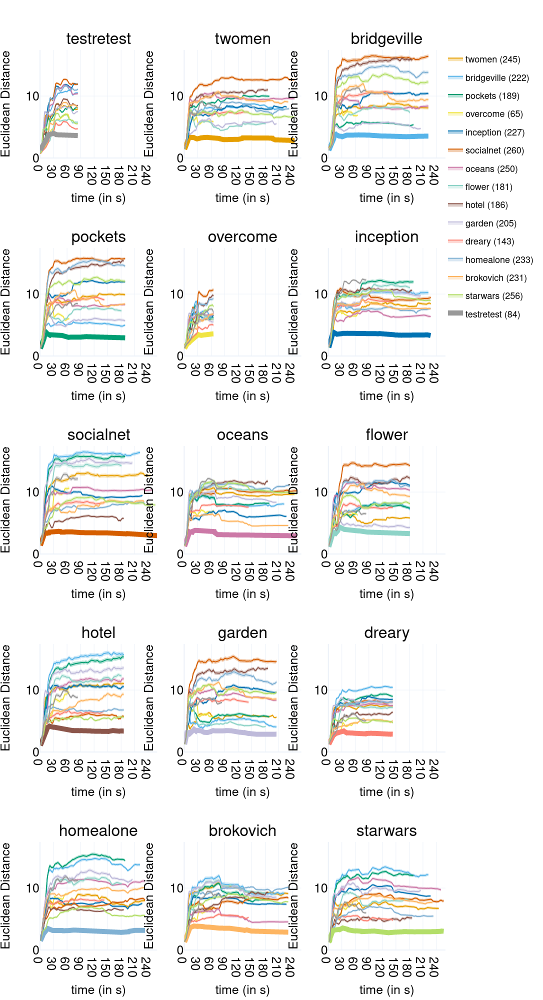

In [18]:
list_of_clips = [label_to_clip[i] for i in range(15)] #[label_to_clip[i] for i in [9, 12, 13]]
print(list_of_clips)
fig = _trajectory_dist(df, test_list, list_of_clips)
fig.show()
fig.write_image(file=f"figures/supp_fig3_euclidean_distances.png",
                format="png", 
                scale=None,
                width=None, 
                height=None, 
                validate=True)

In [16]:
for fig in figs:
    fig.show()

NameError: name 'figs' is not defined

In [ ]:
for idx_clip, clip in enumerate(list_of_clips):
    figs[idx_clip].write_image(file="figures/fig3b_{}.png".format(clip),
                               format="png", 
                               scale=None,
                               width=None, 
                               height=None, 
                               validate=True)